# Analysis on Adjective Frequency in fine food reviews 

## 1st Stage: Parsing the Database

The original database can be found at https://snap.stanford.edu/data/web-FineFoods.html (finefoods.txt.gz), it contains over 500 thousand reviews. For this analysis, 1,112 reviews were randomly extracted (10 thousand lines from the foods.valeutxt file) and placed into the reviews.txt file.

Each review in the base file is separated by a double line break "\n\n". A regex is applied to identify and classify the reviews with the corresponding values to be used.

### Data Entry example
<p>
    <br>
product/productId: B001E4KFG0<br>
review/userId: A3SGXH7AUHU8GW<br>
review/profileName: delmartian<br>
review/helpfulness: 1/1<br>
review/score: 5.0<br>
review/time: 1303862400<br>
review/summary: Good Quality Dog Food<br>
review/text: I have bought several of the Vitality canned dog food products and have<br>
found them all to be of good quality. The product looks more like a stew than a<br>
processed meat and it smells better. My Labrador is finicky and she appreciates this<br>
product better than most.
    <br>
</p>

**Observations:**

<p>When using the libraries for the first time, it will be necessary to install them.<br> In the case of NLTK, it is also necessary to download the English model (usually, when trying to run the code, the required installation line will be provided. For more details, visit <a>https://www.nltk.org/install.html</a>)</p>

```bash
pip install regex
pip install nltk
pip install networkx
pip install matplotlib
```

<p>More details can be found in the article (PT-BR), the link is available in the README.md</p>


In [3]:
import re
import nltk
from collections import Counter

class Review:
    def __init__(self, productId, userId, profileName, helpfulness, score, time, summary, text):
        self.productId = productId
        self.userId = userId
        self.profileName = profileName
        self.helpfulness = helpfulness
        self.score = score
        self.time = time
        self.summary = summary
        self.text = text
    
    def __str__(self):
        return f"Review(productId={self.productId}, userId={self.userId}, profileName={self.profileName}, helpfulness={self.helpfulness}, score={self.score}, time={self.time}, summary={self.summary}, text={self.text})"
    
    def get_adjective_frequency(self):
        adjectives = []
        words =  nltk.word_tokenize(self.text.lower())
        tagged_words = nltk.pos_tag(words)
        
        for word, tag in tagged_words:
            if tag.startswith('JJ'):
                if word != 'i':
                    adjectives.append(word)
        
        adjective_count = Counter(adjectives)
        return list(adjective_count.items())

def parse_reviews(file_path):
    with open(file_path, 'r') as file:
        reviews_text = file.read()

    reviews_text = re.split(r'\n\n', reviews_text)
    reviews = []

    for review_text in reviews_text:
        lines = review_text.strip().split('\n')
        review = {}
        for line in lines:
            key, value = line.split(': ', 1)
            review[key] = value

        review_obj = Review(review['product/productId'],
                            review['review/userId'],
                            review['review/profileName'],
                            review['review/helpfulness'],
                            review['review/score'],
                            review['review/time'],
                            review['review/summary'],
                            review['review/text'])
        reviews.append(review_obj)

    return reviews

file_path = 'reviews.txt'
reviews = parse_reviews(file_path)
print("Parsing Done!")

    



Parsing Done!


## 2nd Stage: Removing Adjectives and Their Frequencies for Each Type of Review Score

In the code below, we are creating the dictionary of adjectives for reviews with a score of 1 star. 
By repeating these steps for each review score, we will generate a total of 5 dictionaries, each corresponding to a different evaluation type.


In [4]:
i = 0
j = 0
result_dict1 = {}
for review in reviews:  
    i+=1
    if review.score == '1.0':
        j+=1
        adjective_frequency = review.get_adjective_frequency()
        adjective_frequency = sorted(adjective_frequency, key=lambda x: x[0])
        for item in adjective_frequency:
            key, value = item
            if key in result_dict1:
                result_dict1[key] += value
            else:
                result_dict1[key] = value
print(str(i)+" Reviews wich "+str(j)+" were 1 Star Reviews")            
#print(result_dict1)

1112 Reviews wich 111 were 1 Star Reviews


In [5]:
i = 0
j = 0
result_dict2 = {}
for review in reviews: 
    i+=1
    if review.score == '2.0':
        j+=1
        adjective_frequency = review.get_adjective_frequency()
        adjective_frequency = sorted(adjective_frequency, key=lambda x: x[0])
        for item in adjective_frequency:
            key, value = item
            if key in result_dict2:
                result_dict2[key] += value
            else:
                result_dict2[key] = value
print(str(i)+" Reviews wich "+str(j)+" were 2 Star Reviews")            
#print(result_dict2)

1112 Reviews wich 55 were 2 Star Reviews


In [6]:
i = 0
j = 0
result_dict3 = {}
for review in reviews:
    i+=1
    if review.score == '3.0':
        j+=1
        adjective_frequency = review.get_adjective_frequency()
        adjective_frequency = sorted(adjective_frequency, key=lambda x: x[0])
        for item in adjective_frequency:
            key, value = item
            if key in result_dict3:
                result_dict3[key] += value
            else:
                result_dict3[key] = value
print(str(i)+" Reviews wich "+str(j)+" were 3 Star Reviews")            
#print(result_dict3)

1112 Reviews wich 85 were 3 Star Reviews


In [7]:
i = 0
j = 0
result_dict4 = {}
for review in reviews:
    i+=1    
    if review.score == '4.0':
        j+=1
        adjective_frequency = review.get_adjective_frequency()
        adjective_frequency = sorted(adjective_frequency, key=lambda x: x[0])
        for item in adjective_frequency:
            key, value = item
            if key in result_dict4:
                result_dict4[key] += value
            else:
                result_dict4[key] = value
print(str(i)+" Reviews wich "+str(j)+" were 4 Star Reviews")            
#print(result_dict4)

1112 Reviews wich 146 were 4 Star Reviews


In [8]:
i = 0
j = 0
result_dict5 = {}
for review in reviews:
    
    i+=1

    
    if review.score == '5.0':
        j+=1

        adjective_frequency = review.get_adjective_frequency()
        adjective_frequency = sorted(adjective_frequency, key=lambda x: x[0])

        for item in adjective_frequency:
            key, value = item
            if key in result_dict5:
                result_dict5[key] += value
            else:
                result_dict5[key] = value
print(str(i)+" Reviews wich "+str(j)+" were 5 Star Reviews")            
#print(result_dict5)

1112 Reviews wich 715 were 5 Star Reviews


## 3rd Stage: Removing Adjectives with Only 1 Occurrence

To enable visual analysis using the Matplotlib library, we need to remove edges with a weight of 1. Otherwise, the occurrences of adjectives under the same vertex in reviews with 4 and 5 stars will not be adequately supported. Although the graphs from the networkx library support such edges, the plot of images does not handle them effectively. After executing all the codes below, you can begin generating the graphs. In the subsequent codes, we will also demonstrate the results, showcasing all the relationships for each type of evaluation.

In [9]:
print("1 Star")
result_dict1 = {key: value for key, value in result_dict1.items() if value != 1}
print(result_dict1)

1 Star
{'small': 3, 'sure': 7, 'different': 10, 'full': 4, 'more': 12, 'new': 15, 'similar': 3, 'red': 2, 'good': 27, 'soft': 2, 'stale': 9, 'bad': 20, 'first': 9, 'hard': 14, 'little': 9, 'local': 7, 'low': 5, 'many': 7, 'much': 10, 'next': 4, 'same': 23, 'short': 3, 'sugar-free': 3, 'terrible': 6, 'tiny': 4, 'unsuspecting': 2, 'returnable': 3, 'whole': 5, 'favorite': 9, 'better': 7, 'special': 2, 'clear': 4, 'dried': 2, 'long': 3, 'old': 6, 'smaller': 4, 'cute': 2, 'free': 7, 'regular': 4, 'strong': 5, '<': 9, 'br': 8, 'horrible': 11, 'normal': 4, 'other': 24, 'picky': 2, 'right': 3, 'smooth': 2, 'fresh': 6, 'lemon': 2, 'plain': 2, 'black': 4, 'brown': 4, 'few': 9, 'pure': 3, 'real': 6, 'sweet': 3, 'white': 6, 'deceptive': 4, 'less': 4, 'big': 3, 'medicinal': 3, 'ok': 2, 'rid': 2, 'weird': 3, 'worst': 7, 'positive': 2, 'awful': 5, 'excellent': 2, 'bitter': 3, 'open': 2, 'thin': 2, 'flat': 2, 'organic': 2, 'entire': 2, 'kettle': 11, 'powdered': 3, 'sour': 9, 'greasy': 5, 'great': 6, '

In [10]:
print("2 Star")
result_dict2 = {key: value for key, value in result_dict2.items() if value != 1}
print(result_dict2)

2 Star
{'good': 18, 'fresh': 2, 'sweet': 3, 'bad': 9, 'least': 3, 'most': 3, 'br': 4, 'large': 4, 'little': 7, 'new': 7, 'several': 2, 'less': 2, 'small': 4, 'much': 7, 'natural': 6, 'herbal': 2, 'real': 3, '<': 10, 'all.': 2, 'flat': 3, 'full': 4, 'huge': 3, 'long': 3, 'more': 8, 'other': 11, 'plastic': 3, 'white': 3, 'wrong': 2, 'enough': 4, 'many': 6, 'own': 3, 'past': 2, 'same': 4, 'weak': 2, 'easy': 3, 'first': 2, 'great': 8, 'healthier': 5, 'high': 5, 'organic': 3, 'best': 9, 'different': 3, 'favorite': 3, 'strong': 3, 'disappointed': 3, 'kettle': 7, 'disappointing': 2, 'sour': 2, 'dark': 2, 'few': 2, 'actual': 2, 'normal': 2, 's/v': 2, 'better': 3, 'mesquite': 2, 'similar': 3, 'sorry': 2, 'unique': 3, 'citric': 2, 'garlic': 3, 'jalapeno': 2, 'lime': 2, 'original': 2, 'safflower': 2, 'sunflower': 2, 'hot': 4, 'tasty': 2, 'whole': 2, 'cheaper': 3, 'old': 2, 'strawberry': 2, 'funny': 2, 'enjoy': 2, 'expensive': 4, 'unsalted': 2, 'overall': 2, 'dry': 2, 'cold': 3, 'european': 2, 'lo

In [11]:
print("3 Star")
result_dict3 = {key: value for key, value in result_dict3.items() if value != 1}
print(result_dict3)

3 Star
{'much': 12, 'good': 23, 'big': 2, 'healthy': 3, 'least': 5, 'same': 9, '<': 9, 'little': 10, 'wrong': 5, 'cold': 2, 'great': 8, 'more': 7, 'natural': 6, 'awesome': 3, 'best': 6, 'different': 4, 'glad': 4, 'other': 14, 'excellent': 7, 'cheaper': 2, 'sure': 5, 'better': 11, 'many': 6, 'old': 5, 'favorite': 5, 'fine': 4, 'open': 3, 'smaller': 2, 'busy': 2, 'extra': 6, 'first': 8, 'larger': 2, 'careful': 3, 'due': 2, 'edible': 3, 'hot': 3, 'next': 6, 'super': 2, 'vegetable': 4, 'dry': 2, 'tasty': 3, 'crystal': 2, 'current': 2, 'large': 2, 'less': 4, 'mixed': 2, 'recent': 3, 'regular': 4, 'similar': 2, 'higher': 4, 'raw': 3, '*': 3, 'expensive': 2, 'half': 2, 'local': 6, 'own': 2, 'br': 3, 'ok': 5, 'typical': 2, 'impossible': 2, 'fresh': 4, 'okay': 3, 'bad': 9, 'sweet': 6, 'cheese': 5, 'fancy': 2, 'greasy': 5, 'kettle': 2, 'vinegary': 2, 'blue': 2, 'decent': 2, 'darn': 2, 'brown': 3, 'able': 3, 'daily': 6, 'whole': 5, 'general': 2, 'nutritional': 3, 'right': 2, 'hard': 5, 'harsh': 2

In [12]:
print("4 Star")
result_dict4 = {key: value for key, value in result_dict4.items() if value != 1}
print(result_dict4)

4 Star
{'familiar': 2, 'few': 11, 'flavorful': 3, 'light': 6, 'tiny': 4, 'yummy': 2, 'delightful': 2, 'many': 16, 'much': 20, 'only': 10, 'particular': 3, 'delicious': 9, 'fresh': 7, 'good': 62, 'glad': 4, 'great': 39, 'hard': 9, 'such': 4, 'unique': 5, 'actual': 3, 'best': 18, 'better': 23, 'convenient': 2, 'high': 10, 'instant': 9, 'oatmeal': 2, 'organic': 8, 'other': 31, 'real': 6, 'tasty': 8, 'thick': 6, 'brown': 8, 'cold': 2, 'regular': 10, 'irish': 2, 'sweet': 15, 'least': 4, 'own': 5, 'ready': 3, 'easy': 7, 'fine': 7, 'quick': 2, '<': 13, 'black': 3, 'hot': 10, 'important': 3, 'last': 9, 'nose': 2, 'ordinary': 2, 'dark': 2, 'direct': 2, 'first': 12, 'green': 9, 'smooth': 2, 'strong': 11, 'full': 7, 'crazy': 2, 'perfect': 8, 'bad': 8, 'expensive': 9, 'long': 3, 'cheaper': 4, 'prime': 2, 'easier': 3, 'entire': 2, 'open': 4, 'free': 6, 'strawberry': 2, 'pretty': 6, 'fat': 3, 'low': 5, 'lemon': 2, 'less': 15, 'same': 10, 'stronger': 2, 'frozen': 2, 'odd': 2, 'sure': 8, 'wish': 5, 's

In [13]:
print("5 Star")
result_dict5 = {key: value for key, value in result_dict5.items() if value != 1}
print(result_dict5)

5 Star
{'better': 52, 'dog': 2, 'finicky': 3, 'good': 231, 'most': 30, 'several': 23, 'great': 245, 'quick': 13, 'chewy': 2, 'expensive': 22, 'soft': 15, 'satisfying': 4, 'healthy': 25, 'small': 35, 'bummed.': 2, 'ecstatic': 2, 'hot': 62, 'incredible': 5, 'it.': 6, 'other': 133, 'personal': 7, 'unique': 12, 'higher': 9, 'skinny': 2, 'guilty': 3, 'more': 72, 'satisfied': 5, 'blue': 7, 'br': 34, 'dry': 17, 'favorite': 66, 'green': 31, 'guinness': 2, 's': 2, 'united': 5, 'young': 2, 'reasonable': 8, 'unable': 4, 'fresh': 53, 'many': 61, 'tasty': 40, 'timely': 2, '<': 91, 'superb': 4, 'weight': 2, 'able': 19, 'miss': 2, 'yum': 2, 'diabetic': 3, 'excellent': 36, 'free': 37, 'impressed': 5, 'much': 61, 'sugar-free': 2, 'sugary': 3, 'sweet': 34, 'unnecessary': 2, 'easy': 34, 'huge': 5, 'less': 20, 'little': 81, 'super': 11, '10-count': 2, 'best': 134, 'close': 3, 'instant': 18, 'irish': 4, 'longer': 6, 'non-instant': 3, 'regular': 34, 'same': 23, 'soggy': 2, 'celiac': 2, 'add': 2, 'half': 2, 

**Optional Section**

This section is optional. If you wish to generate one file for each type of review containing their dictionary of relationships, it can be useful for checking the frequency of a specific adjective that did not qualify as the highest or lowest frequency.


In [14]:
with open("review1.txt", "w") as file:
    # Iterate over the dictionary items
    for key, value in result_dict1.items():
        # Write the key-value pair to the file
        file.write(f"{key}: {value}\n")
        
with open("review2.txt", "w") as file:
    # Iterate over the dictionary items
    for key, value in result_dict2.items():
        # Write the key-value pair to the file
        file.write(f"{key}: {value}\n")
        
with open("review3.txt", "w") as file:
    # Iterate over the dictionary items
    for key, value in result_dict3.items():
        # Write the key-value pair to the file
        file.write(f"{key}: {value}\n")

with open("review4.txt", "w") as file:
    # Iterate over the dictionary items
    for key, value in result_dict4.items():
        # Write the key-value pair to the file
        file.write(f"{key}: {value}\n")

with open("review5.txt", "w") as file:
    # Iterate over the dictionary items
    for key, value in result_dict5.items():
        # Write the key-value pair to the file
        file.write(f"{key}: {value}\n")
        
print("Done!")

Done!


## 4th Stage: Generating Graphs and Coloring Vertices Based on Edge Weights

In this section, we utilize the networkx library to create graphs. We insert edges where the first vertex represents the review score, the second vertex corresponds to the adjectives (keys), and the weight of the edge represents the frequency of the adjective. Next, the edges are sorted using a lambda function, and we extract the top 10 highest and lowest weighted edges for each review score. Finally, we pass the parameters to the plot function, for coloring the vertices and display the figure. By executing the codes below, we will obtain separate results for each review score.


## 1🌟
### High
<p>good:27, other:24, same:23, bad:20, best:16, new:15, hard:14, more:12, horrible:11, kettle:11</p>

### Low

<p>red:2, soft:2, unsuspecting:2, special:2, dried:2, cute:2, picky:2, smooth:2, lemon:2, plain:2</p>

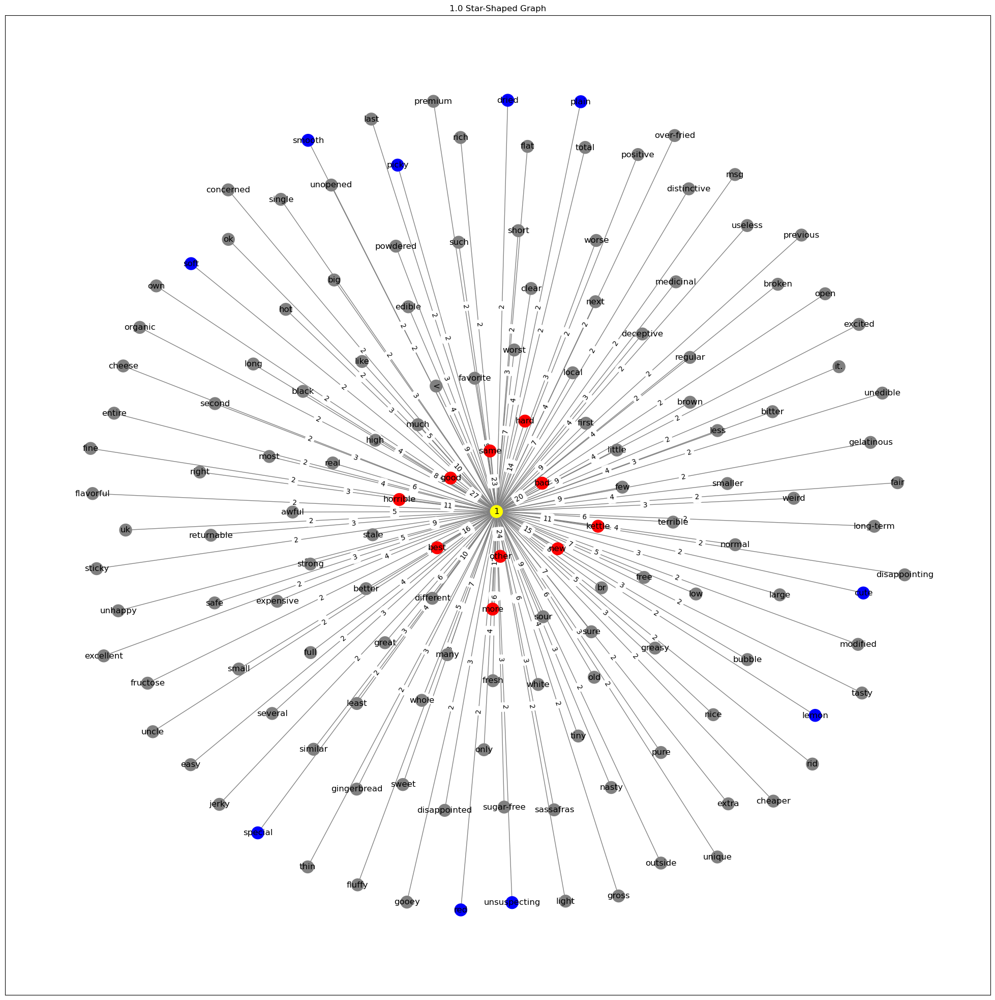

In [15]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G1 = nx.Graph()

# Add edges and vertices to the graph
graph_dict = result_dict1
for vertex, weight in graph_dict.items():
    G1.add_edge('1', vertex, weight=weight)

# Get the edges with weights sorted in ascending order
edges_sorted = sorted(G1.edges(data=True), key=lambda x: x[2]['weight'])
lowest_edges1 = edges_sorted[:10]  
highest_edges1 = edges_sorted[-10:]  


vertex_colors = []
for v in G1.nodes():
    if v == '1':
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(v == edge[1] for edge in lowest_edges1):
        vertex_colors.append('blue')  # Color vertices connected to lowest edges as blue
    elif any(v == edge[1] for edge in highest_edges1):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

# Plot the graph
pos = nx.spring_layout(G1)  # Layout algorithm for node positioning
edge_labels = nx.get_edge_attributes(G1, 'weight')

plt.figure(figsize=(25, 25)) 

nx.draw_networkx(G1, pos, node_color=vertex_colors, edge_color='gray', with_labels=True)
nx.draw_networkx_edge_labels(G1, pos, edge_labels=edge_labels)

plt.title('1.0 Star-Shaped Graph')

plt.show()


In [16]:
print(lowest_edges1)
print(highest_edges1)

[('1', 'red', {'weight': 2}), ('1', 'soft', {'weight': 2}), ('1', 'unsuspecting', {'weight': 2}), ('1', 'special', {'weight': 2}), ('1', 'dried', {'weight': 2}), ('1', 'cute', {'weight': 2}), ('1', 'picky', {'weight': 2}), ('1', 'smooth', {'weight': 2}), ('1', 'lemon', {'weight': 2}), ('1', 'plain', {'weight': 2})]
[('1', 'horrible', {'weight': 11}), ('1', 'kettle', {'weight': 11}), ('1', 'more', {'weight': 12}), ('1', 'hard', {'weight': 14}), ('1', 'new', {'weight': 15}), ('1', 'best', {'weight': 16}), ('1', 'bad', {'weight': 20}), ('1', 'same', {'weight': 23}), ('1', 'other', {'weight': 24}), ('1', 'good', {'weight': 27})]


<h2>2🌟</h2>
<h3>High</h3>
<p>good:18, other:11, <:10, best:9, bad:9, great:8, more:8, kettle:7, much:7, new:7</p>
<h3>Low</h3>
<p>fresh:2, several:2, less:2, herbal:2, all:2, wrong:2, past:2, weak:2, first:2, disappointing:2</p>

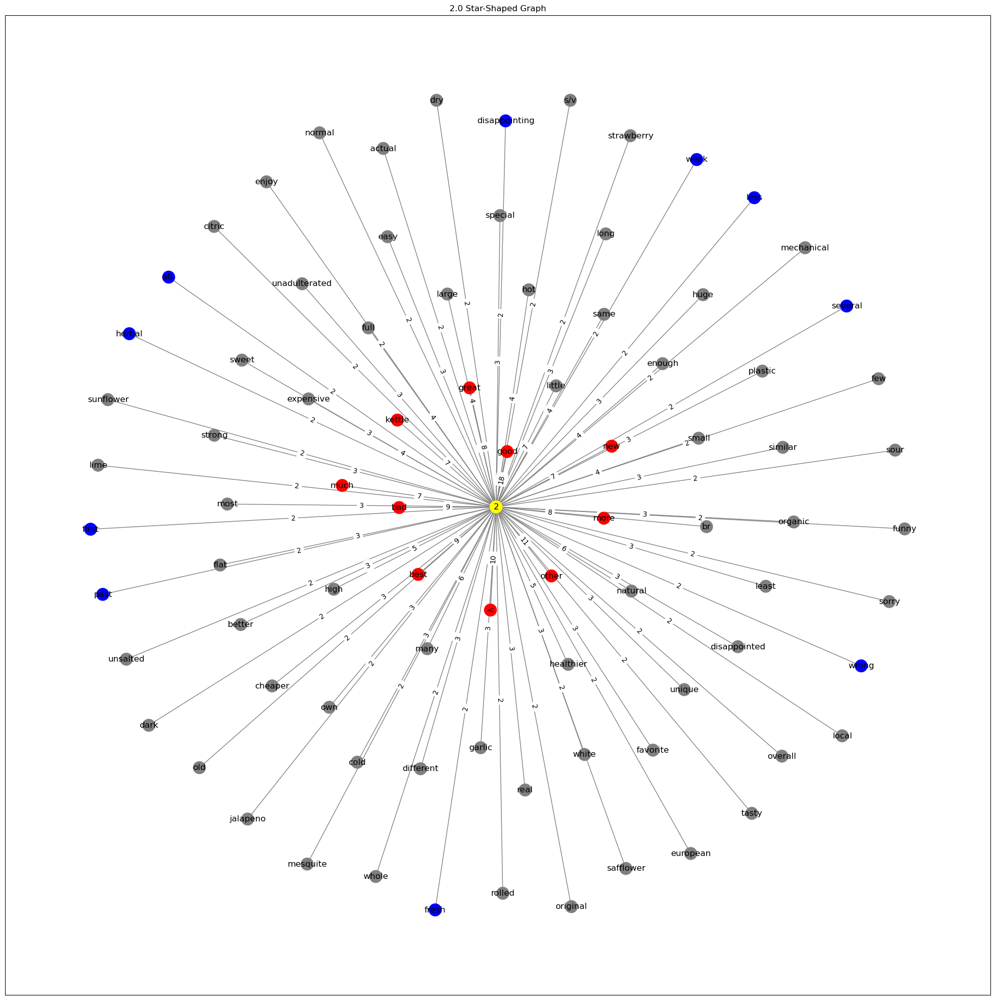

In [17]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G2 = nx.Graph()

# Add edges and vertices to the graph
graph_dict = result_dict2
for vertex, weight in graph_dict.items():
    G2.add_edge('2', vertex, weight=weight)

# Get the edges with weights sorted in ascending order
edges_sorted = sorted(G2.edges(data=True), key=lambda x: x[2]['weight'])
lowest_edges2 = edges_sorted[:10]
highest_edges2 = edges_sorted[-10:]

vertex_colors = []
for v in G2.nodes():
    if v == '2':
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(v == edge[1] for edge in lowest_edges2):
        vertex_colors.append('blue')  # Color vertices connected to lowest edges as blue
    elif any(v == edge[1] for edge in highest_edges2):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

# Plot the graph
pos = nx.spring_layout(G2)  # Layout algorithm for node positioning
edge_labels = nx.get_edge_attributes(G2, 'weight')

plt.figure(figsize=(25, 25)) # Adjust the figure size as needed

nx.draw_networkx(G2, pos, node_color=vertex_colors, edge_color='gray', with_labels=True)
nx.draw_networkx_edge_labels(G2, pos, edge_labels=edge_labels)

plt.title('2.0 Star-Shaped Graph')

plt.show()


In [18]:
print(lowest_edges2)
print(highest_edges2)

[('2', 'fresh', {'weight': 2}), ('2', 'several', {'weight': 2}), ('2', 'less', {'weight': 2}), ('2', 'herbal', {'weight': 2}), ('2', 'all.', {'weight': 2}), ('2', 'wrong', {'weight': 2}), ('2', 'past', {'weight': 2}), ('2', 'weak', {'weight': 2}), ('2', 'first', {'weight': 2}), ('2', 'disappointing', {'weight': 2})]
[('2', 'new', {'weight': 7}), ('2', 'much', {'weight': 7}), ('2', 'kettle', {'weight': 7}), ('2', 'more', {'weight': 8}), ('2', 'great', {'weight': 8}), ('2', 'bad', {'weight': 9}), ('2', 'best', {'weight': 9}), ('2', '<', {'weight': 10}), ('2', 'other', {'weight': 11}), ('2', 'good', {'weight': 18})]


<h2>3🌟</h2>
<h3>High</h3>
<p>organic:26, good:23, other:14, much:12, better:11, little:10, bad:9, <:9, same:9, first:8</p>
<h3>Low</h3>
<p>big:2, cold:2, cheaper:2, smaller:2, busy: 2, larger: 2, due:2, super:2, dry:2, crystal:2</p>

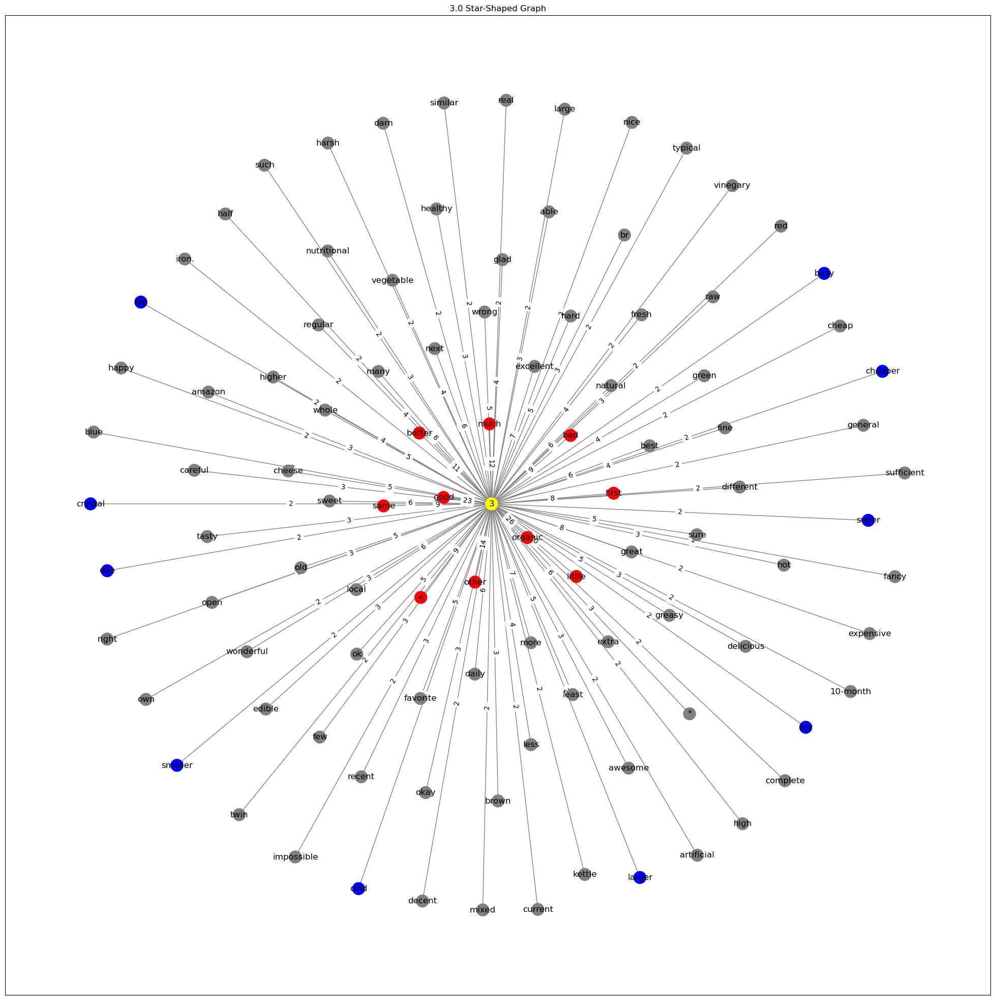

In [19]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G3 = nx.Graph()

# Add edges and vertices to the graph
graph_dict = result_dict3
for vertex, weight in graph_dict.items():
    G3.add_edge('3', vertex, weight=weight)

# Get the edges with weights sorted in ascending order
edges_sorted = sorted(G3.edges(data=True), key=lambda x: x[2]['weight'])
lowest_edges3 = edges_sorted[:10]
highest_edges3 = edges_sorted[-10:]

vertex_colors = []
for v in G3.nodes():
    if v == '3':
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(v == edge[1] for edge in lowest_edges3):
        vertex_colors.append('blue')  # Color vertices connected to lowest edges as blue
    elif any(v == edge[1] for edge in highest_edges3):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

# Plot the graph
pos = nx.spring_layout(G3)  # Layout algorithm for node positioning
edge_labels = nx.get_edge_attributes(G3, 'weight')

plt.figure(figsize=(25, 25))  # Adjust the figure size as needed

nx.draw_networkx(G3, pos, node_color=vertex_colors, edge_color='gray', with_labels=True)
nx.draw_networkx_edge_labels(G3, pos, edge_labels=edge_labels)

plt.title('3.0 Star-Shaped Graph')

plt.show()


In [20]:
print(lowest_edges3)
print(highest_edges3)

[('3', 'big', {'weight': 2}), ('3', 'cold', {'weight': 2}), ('3', 'cheaper', {'weight': 2}), ('3', 'smaller', {'weight': 2}), ('3', 'busy', {'weight': 2}), ('3', 'larger', {'weight': 2}), ('3', 'due', {'weight': 2}), ('3', 'super', {'weight': 2}), ('3', 'dry', {'weight': 2}), ('3', 'crystal', {'weight': 2})]
[('3', 'first', {'weight': 8}), ('3', 'same', {'weight': 9}), ('3', '<', {'weight': 9}), ('3', 'bad', {'weight': 9}), ('3', 'little', {'weight': 10}), ('3', 'better', {'weight': 11}), ('3', 'much', {'weight': 12}), ('3', 'other', {'weight': 14}), ('3', 'good', {'weight': 23}), ('3', 'organic', {'weight': 26})]


<h2>4🌟</h2>
<h3>High</h3>
<p>good:62, great:39, other:31, better:23, more:21, much:20, best:18, small:17, little:17, many:16</p>
<h3>Low</h3>
<p>familia:2, yummy:2, delightful:2, convenient:2, oatmeal:2, cold:2, irish:2, quick:2, nose:2, ordinary:2</p>

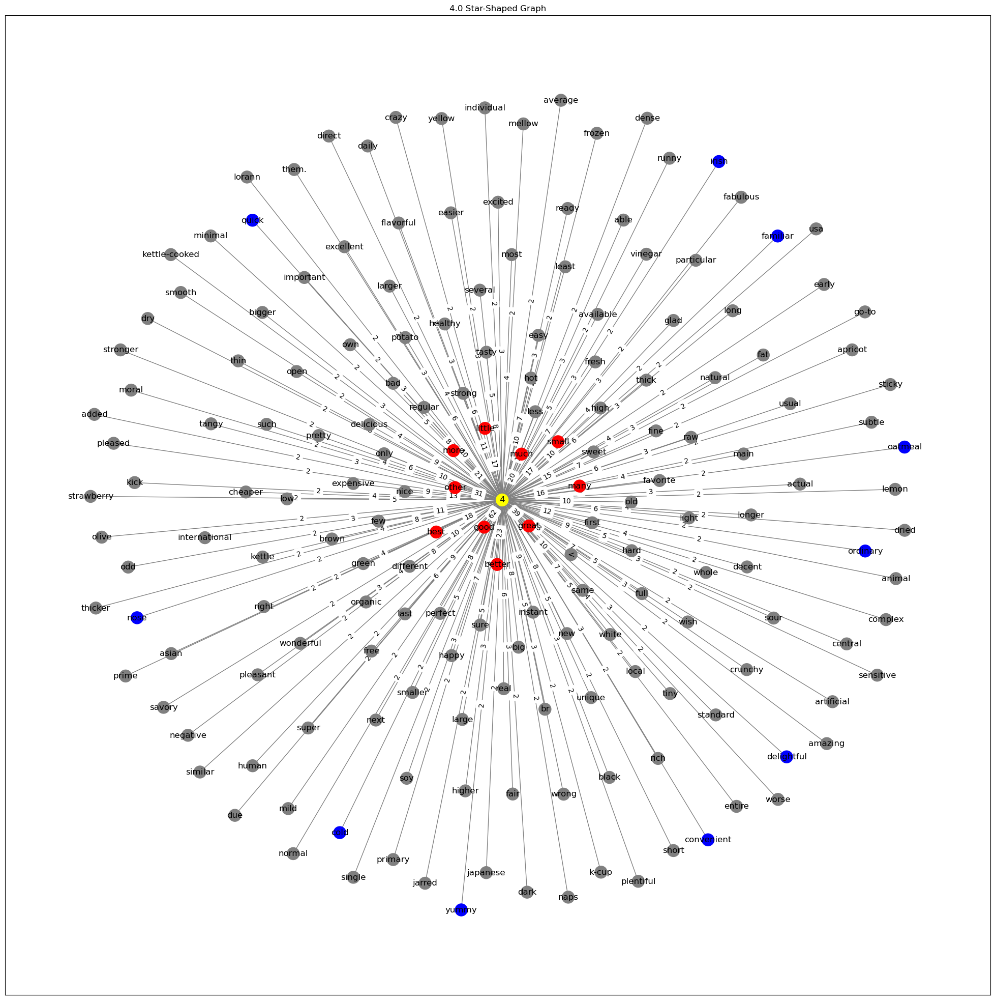

In [21]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G4 = nx.Graph()

# Add edges and vertices to the graph
graph_dict = result_dict4
for vertex, weight in graph_dict.items():
    G4.add_edge('4', vertex, weight=weight)

# Get the edges with weights sorted in ascending order
edges_sorted = sorted(G4.edges(data=True), key=lambda x: x[2]['weight'])
lowest_edges4 = edges_sorted[:10]
highest_edges4 = edges_sorted[-10:]

vertex_colors = []
for v in G4.nodes():
    if v == '4':
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(v == edge[1] for edge in lowest_edges4):
        vertex_colors.append('blue')  # Color vertices connected to lowest edges as blue
    elif any(v == edge[1] for edge in highest_edges4):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

# Plot the graph
pos = nx.spring_layout(G4)  # Layout algorithm for node positioning
edge_labels = nx.get_edge_attributes(G4, 'weight')

plt.figure(figsize=(25, 25)) # Adjust the figure size as needed

nx.draw_networkx(G4, pos, node_color=vertex_colors, edge_color='gray', with_labels=True)
nx.draw_networkx_edge_labels(G4, pos, edge_labels=edge_labels)

plt.title('4.0 Star-Shaped Graph')

plt.show()


In [22]:
print(lowest_edges4)
print(highest_edges4)

[('4', 'familiar', {'weight': 2}), ('4', 'yummy', {'weight': 2}), ('4', 'delightful', {'weight': 2}), ('4', 'convenient', {'weight': 2}), ('4', 'oatmeal', {'weight': 2}), ('4', 'cold', {'weight': 2}), ('4', 'irish', {'weight': 2}), ('4', 'quick', {'weight': 2}), ('4', 'nose', {'weight': 2}), ('4', 'ordinary', {'weight': 2})]
[('4', 'many', {'weight': 16}), ('4', 'little', {'weight': 17}), ('4', 'small', {'weight': 17}), ('4', 'best', {'weight': 18}), ('4', 'much', {'weight': 20}), ('4', 'more', {'weight': 21}), ('4', 'better', {'weight': 23}), ('4', 'other', {'weight': 31}), ('4', 'great', {'weight': 39}), ('4', 'good', {'weight': 62})]


<h2>5🌟</h2>
<h3>High</h3>
<p>great:245, good:231, best:134, other:133, <:91, little:81, more:72, favorite:66, delicious:65, hot:62</p>
<h3>Low</h3>
<p>dog:2, chewy:2, bummed:2, ecstatic:2, skinny:2, guinness:2, s:2, young:2, timely:2, weight:2</p>

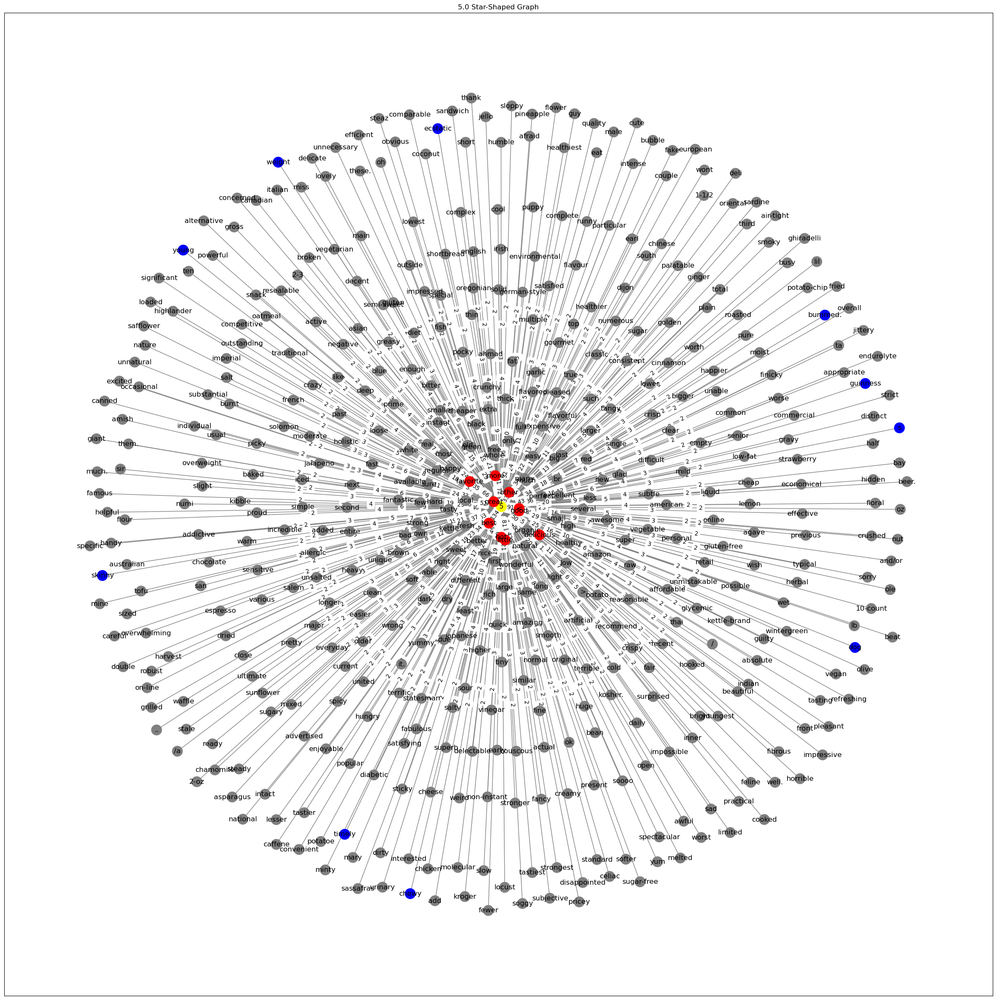

In [23]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G5 = nx.Graph()

# Add edges and vertices to the graph
graph_dict = result_dict5
for vertex, weight in graph_dict.items():
    G5.add_edge('5', vertex, weight=weight)

# Get the edges with weights sorted in ascending order
edges_sorted = sorted(G5.edges(data=True), key=lambda x: x[2]['weight'])
lowest_edges5 = edges_sorted[:10]
highest_edges5 = edges_sorted[-10:]

vertex_colors = []
for v in G5.nodes():
    if v == '5':
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(v == edge[1] for edge in lowest_edges5):
        vertex_colors.append('blue')  # Color vertices connected to lowest edges as blue
    elif any(v == edge[1] for edge in highest_edges5):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

# Plot the graph
pos = nx.spring_layout(G5)  # Layout algorithm for node positioning
edge_labels = nx.get_edge_attributes(G5, 'weight')

plt.figure(figsize=(30, 30))  # Adjust the figure size as needed

nx.draw_networkx(G5, pos, node_color=vertex_colors, edge_color='gray', with_labels=True)
nx.draw_networkx_edge_labels(G5, pos, edge_labels=edge_labels)

plt.title('5.0 Star-Shaped Graph')

plt.show()


In [24]:
print(lowest_edges5)
print(highest_edges5)

[('5', 'dog', {'weight': 2}), ('5', 'chewy', {'weight': 2}), ('5', 'bummed.', {'weight': 2}), ('5', 'ecstatic', {'weight': 2}), ('5', 'skinny', {'weight': 2}), ('5', 'guinness', {'weight': 2}), ('5', 's', {'weight': 2}), ('5', 'young', {'weight': 2}), ('5', 'timely', {'weight': 2}), ('5', 'weight', {'weight': 2})]
[('5', 'hot', {'weight': 62}), ('5', 'delicious', {'weight': 65}), ('5', 'favorite', {'weight': 66}), ('5', 'more', {'weight': 72}), ('5', 'little', {'weight': 81}), ('5', '<', {'weight': 91}), ('5', 'other', {'weight': 133}), ('5', 'best', {'weight': 134}), ('5', 'good', {'weight': 231}), ('5', 'great', {'weight': 245})]


## 5th Stage: Combining All 5 Graphs into a Single Network

In this stage, we utilize the `compose_all` function to merge the 5 previous graphs into a single network. After that, we color the vertices in such a way that the main vertices remain yellow, while all the high-frequency vertices continue to be colored red (including those present in the previous lists, some of which may be shared).

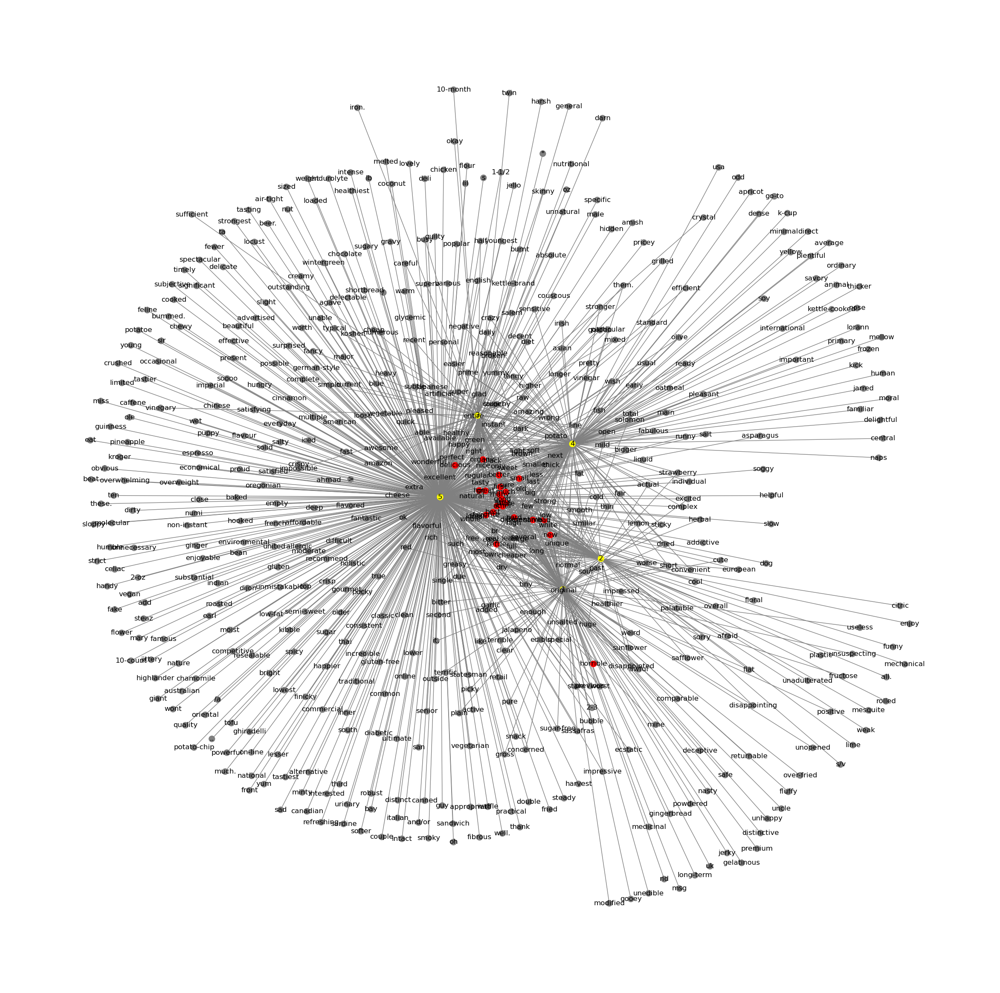

In [25]:
complete_G = nx.compose_all([G1,G2,G3,G4,G5])
vertex_colors = []
vector_list = [highest_edges1, highest_edges2, highest_edges3, highest_edges4, highest_edges5]
for v in complete_G.nodes():
    if v in ['5','4','3','2','1']:
        vertex_colors.append('yellow')  # Color the central vertex gray
    elif any(any(v == edge[1] for edge in vector) for vector in vector_list):
        vertex_colors.append('red')  # Color vertices connected to highest edges as red
    else:
        vertex_colors.append('gray')  # Color other vertices gray

fig, ax = plt.subplots(figsize=(30,30))
pos = nx.spring_layout(complete_G)
nx.draw(complete_G, with_labels = True, node_size = 100, font_size = 12, node_color=vertex_colors, edge_color='gray',ax = ax)
plt.show()

## Bonus Stage: Generating a Bipartite Graph

As identified earlier, we can divide our vertices into 2 types: review scores and adjectives. With this division, we can create a bipartite graph based only on the relevant occurrences, which will provide a more visual result. This graph excludes the previous grayed-out adjectives for better clarity.

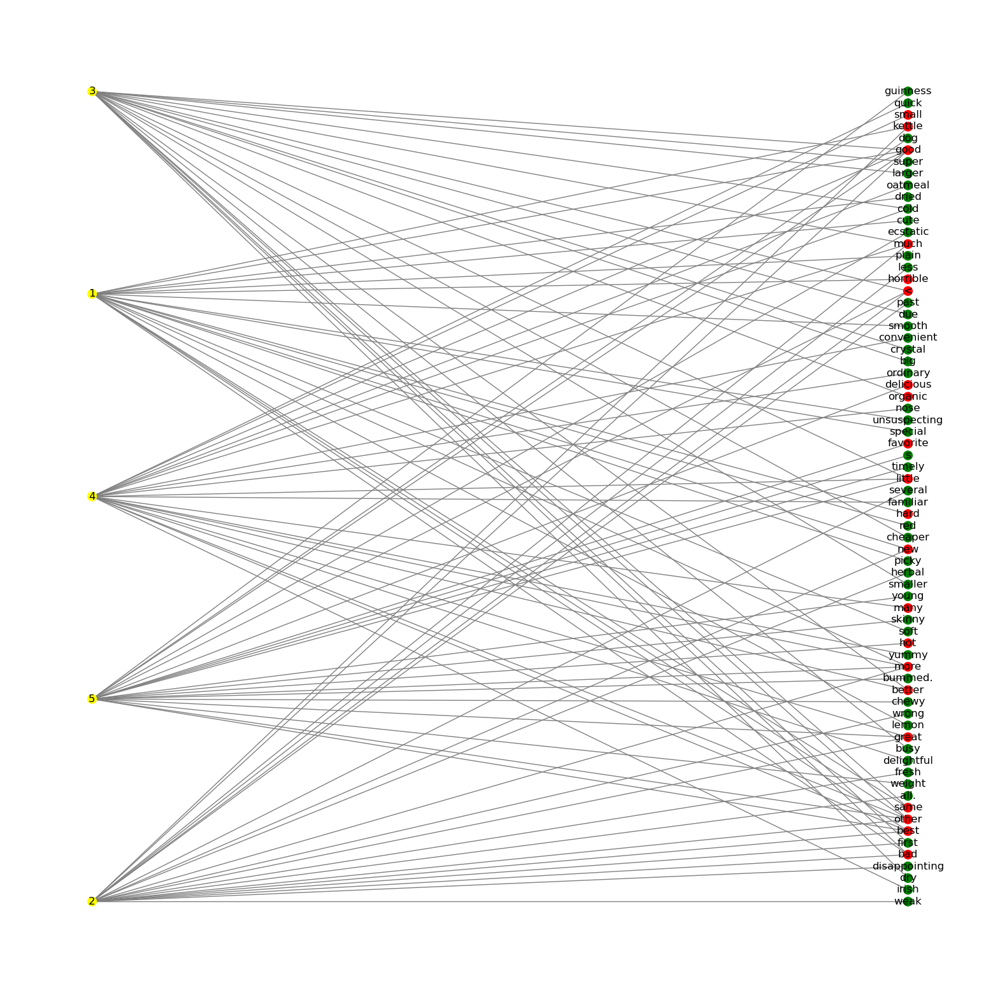

In [26]:
import networkx as nx
import matplotlib.pyplot as plt

nodes_set1 = ['1', '2', '3', '4', '5']

bipartite_G = nx.Graph()
bipartite_G.add_nodes_from(nodes_set1, bipartite=0)

bipartite_G.add_edges_from(highest_edges1)
bipartite_G.add_edges_from(highest_edges2)
bipartite_G.add_edges_from(highest_edges3)
bipartite_G.add_edges_from(highest_edges4)
bipartite_G.add_edges_from(highest_edges5)

bipartite_G.add_edges_from(lowest_edges1)
bipartite_G.add_edges_from(lowest_edges2)
bipartite_G.add_edges_from(lowest_edges3)
bipartite_G.add_edges_from(lowest_edges4)
bipartite_G.add_edges_from(lowest_edges5)

vertex_colorsF = []

vector_listH = [highest_edges1,highest_edges2,highest_edges3,highest_edges4,highest_edges5]
vector_listL = [lowest_edges1,lowest_edges2,lowest_edges3,lowest_edges4,lowest_edges5]
for v in bipartite_G.nodes():
    if v in ['5', '4', '3', '2', '1']:
        vertex_colorsF.append('yellow')  # Color the central vertex yellow
    elif any(any(v == edge[1] for edge in vector) for vector in vector_listL):
        vertex_colorsF.append('green')
    elif any(any(v == edge[1] for edge in vector) for vector in vector_listH):
        vertex_colorsF.append('red')
    else:
        vertex_colorsF.append('gray')  # Color other vertices gray

fig, ax = plt.subplots(figsize=(20, 20))
pos = nx.bipartite_layout(bipartite_G, nodes_set1, align='vertical')
nx.draw(
    bipartite_G,
    pos=pos,
    with_labels=True,
    node_size=100,
    font_size=12,
    edge_color='gray',
    node_color=vertex_colorsF,  # Assign vertex colors
    ax=ax
)
plt.show()


Below are examples of tests to identify if there are common edges with low frequency in one review score and high frequency in another (in case it is necessary to color them differently, like orange). Additionally, methods to find the individual incidence of adjectives for each review score type.

In [27]:
common_edges = []

for edge_h in vector_listH:
    if edge_h in vector_listL:
        common_edges.append(edge_h)
        
print(common_edges)

degree = bipartite_G.degree["5"]
print(degree)

[]
20


In [28]:
degree = complete_G.degree["full"]
print(degree)
edge_data = complete_G.get_edge_data("1", "full")
weight1 = edge_data['weight']
edge_data = complete_G.get_edge_data("2", "full")
weight2 = edge_data['weight']
#edge_data = complete_G.get_edge_data("3", "full")
#weight3 = edge_data['weight']
edge_data = complete_G.get_edge_data("4", "full")
weight4 = edge_data['weight']
edge_data = complete_G.get_edge_data("5", "full")
weight5 = edge_data['weight']
print("Weights : "+str(weight1)+" "+str(weight2)+" "+str(weight4)+" "+str(weight5)+" ")

4
Weights : 4 4 7 24 
